## Importing Dependencies

In [ ]:
!pip install datasets

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 491.2/491.2 kB 4.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 11.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 183.9/183.9 kB 15.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 143.5/143.5 kB 14.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.8/194.8 kB 20.0 MB/s eta 0:00:00
  Attempting uninstall: fsspec
    Found existing installation: fsspec 2025.3.2
    Uninstalling fsspec-2025.3.2:
      Successfully uninstalled fsspec-2025.3.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
gcsfs 2025.3.2 requires fsspec==2025.3.2, but you have fsspec 2024.12.0 which is incompatible.
torch 2.6.0+cu124 requires nvidia-cublas-cu12==12.4.5.8; platform_system == "Linux" and platform_machine == "x86_64", but you have nvidia-cublas-cu12 12.5.3.2 which 

In [ ]:
from datasets import load_dataset
from transformers import AutoTokenizer
from tqdm.notebook import tqdm
import torch.nn.functional as F
import torch.utils.data as data
import torch.nn as nn
import torch.optim as optim
import torch
import pickle
import math
import wandb
import os

## Relative Positional Encoding

* The `get_relative_sinusoidal_positional_encoding(seq_len, d_model)` function generates relative sinusoidal positional encodings.
* This creates encodings for all possible relative distances between positions
in a sequence of length `seq_len`. The relative distances range from
`-(seq_len - 1) to +(seq_len - 1)`.

* Arguments:
    * `seq_len (int)`: The maximum sequence length, which determines the range of relative distances needed.
    * `d_model (int)`: The dimensionality of the model embeddings.

* Returns:
    * `torch.Tensor`: A tensor of shape `(2 * seq_len - 1, d_model)` containing the relative positional encodings. The central row `(index seq_len - 1)` corresponds to a relative distance of `0`.

In [ ]:
import torch
import math

def get_relative_positional_encoding(seq_len, d_model):
    # Maximum absolute relative distance
    max_rel_dist = seq_len - 1
    # Total number of unique relative positions
    num_relative_positions = 2 * max_rel_dist + 1

    # Initialize tensor to hold relative position encodings
    pe = torch.zeros(num_relative_positions, d_model)

    relative_position = torch.arange(-max_rel_dist, max_rel_dist + 1, dtype=torch.float32).unsqueeze(1) # Shape: (num_relative_positions, 1)
    div_term = torch.exp(torch.arange(0, d_model, 2).float() * (-math.log(10000.0) / d_model)) # Shape: (d_model / 2,)

    # Apply sin to even indices using relative positions
    pe[:, 0::2] = torch.sin(relative_position * div_term)

    # Apply cos to odd indices using relative positions
    pe[:, 1::2] = torch.cos(relative_position * div_term)

    return pe

In [ ]:
def get_relative_positional_encoding(seq_len, d_model):
    # Maximum absolute relative distance
    max_rel_dist = seq_len - 1
    # Total number of unique relative positions
    num_relative_positions = 2 * max_rel_dist + 1

    # Initialize tensor to hold relative position encodings
    pe = torch.zeros(num_relative_positions, d_model)

    relative_position = torch.arange(-max_rel_dist, max_rel_dist + 1, dtype=torch.float32).unsqueeze(1) # Shape: (num_relative_positions, 1)
    div_term = torch.exp(torch.arange(0, d_model, 2).float() * (-math.log(10000.0) / d_model)) # Shape: (d_model / 2,)

    # Apply sin to even indices using relative positions
    pe[:, 0::2] = torch.sin(relative_position * div_term)

    # Apply cos to odd indices using relative positions
    pe[:, 1::2] = torch.cos(relative_position * div_term)

    return pe

* Plotting some dimensions

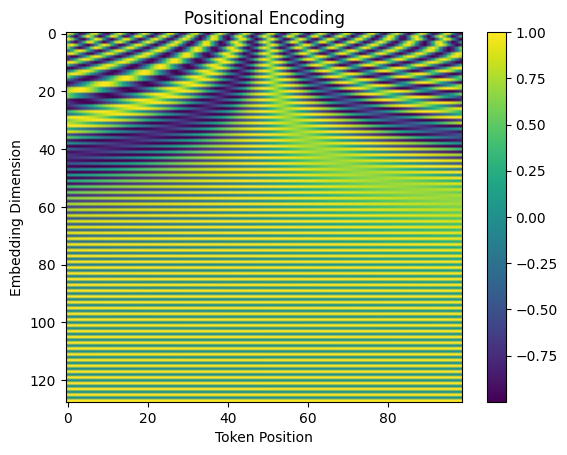

In [ ]:
import matplotlib.pyplot as plt

seq_len = 50
d_model = 128
pos_encoding = get_relative_positional_encoding(seq_len, d_model)
plt.imshow(pos_encoding.T, cmap="viridis", aspect="auto")
plt.title("Positional Encoding")
plt.xlabel("Token Position")
plt.ylabel("Embedding Dimension")
plt.colorbar()
plt.show()

## Token Embedding & Positional Encoding

In [ ]:
class TokenAndPositionalEmbedding(nn.Module):
    def __init__(self, vocab_size, d_model, max_len):
        super().__init__()
        self.token_embed = nn.Embedding(vocab_size, d_model)
        self.pos_encoding = get_relative_positional_encoding(max_len, d_model)

    def forward(self, x):
        seq_len = x.size(1)
        token_emb = self.token_embed(x)
        pos_emb = self.pos_encoding[:seq_len, :].to(x.device)
        return token_emb + pos_emb

# Transformer

In [ ]:
class DecoderOnlyTransformer(nn.Module):
    def __init__(self, vocab_size, d_model, n_heads, d_ff, max_len, num_layers):
        super().__init__()
        self.embed = TokenAndPositionalEmbedding(vocab_size, d_model, max_len)
        decoder_layer = nn.TransformerDecoderLayer(d_model=d_model,
                                                     nhead=n_heads,
                                                     dim_feedforward=d_ff,
                                                     activation='gelu',
                                                     batch_first=True,
                                                     norm_first=False,
                                                     bias=True)
        norm = nn.LayerNorm(d_model)
        self.transformer_decoder = nn.TransformerDecoder(decoder_layer=decoder_layer, num_layers=6, norm=norm)
        self.output_proj = nn.Linear(d_model, vocab_size)

    def forward(self, x):
        x = self.embed(x)
        T = x.size(1)

        # Causal Mask erstellen
        causal_mask = torch.triu(torch.ones(T, T), diagonal=1).bool().to(x.device)

        # Dummy Memory
        memory = torch.zeros(x.size(0), 1, x.size(2)).to(x.device)

        x = self.transformer_decoder(tgt=x, memory=memory, tgt_mask=causal_mask)
        # x = self.norm(x)
        logits = self.output_proj(x)
        return logits

## Model Training Function

In [ ]:
def train(model, dataloader, vocab_size, device, epochs, lr, checkpoint=None):
    # load checkpoint if exists
    if not checkpoint is None:
      print('loading checkpoint')
      model.load_state_dict(checkpoint['net'])
      best_acc = checkpoint['acc']
      start_epoch = checkpoint['epoch']
    else:
      start_epoch = 0
      best_acc = 0

    # Initialize wandb
    run = wandb.init(
        entity="fhennidi-hochschule-hannover",
        project="Intocode_Generative_AI_Project",
        config={
            "learning_rate": lr,
            "architecture": "Decoder Only Transformer",
            "dataset": "manu/project_gutenberg",
            "epochs": epochs,
        },
    )

    # Move model to device
    model = model.to(device)

    # Initialize optimizer and loss function
    optimizer = optim.Adam(model.parameters(), lr=lr)
    criterion = nn.CrossEntropyLoss(ignore_index=0)  # Assuming 0 is padding token

    # Training loop
    for epoch in range(start_epoch, epochs):
        model.train()
        total_loss = 0
        total_correct = 0
        total_tokens = 0
        num_batches = 0

        for batch in tqdm(dataloader, desc="Training Progress"):
            # Get input and target sequences
            inputs = batch[:, :-1].to(device)
            targets = batch[:, 1:].to(device)

            # Zero gradients
            optimizer.zero_grad()

            # Forward pass
            outputs = model(inputs)

            # Reshape outputs and targets for loss calculation
            batch_size, seq_len, _ = outputs.shape
            outputs = outputs.reshape(batch_size * seq_len, vocab_size)
            targets = targets.reshape(batch_size * seq_len)

            # Calculate loss
            loss = criterion(outputs, targets)

            # Backward pass and optimize
            loss.backward()
            optimizer.step()

            # Calculate accuracy
            _, predicted = torch.max(outputs, dim=-1)
            correct = (predicted == targets).sum().item()
            total_correct += correct
            total_tokens += targets.numel() - (targets == 0).sum().item()  # Exclude padding tokens

            total_loss += loss.item()
            num_batches += 1

        # Print average loss for the epoch
        avg_loss = total_loss / num_batches
        avg_acc = total_correct / total_tokens
        if avg_acc > best_acc:
          state = {
              'net': model.state_dict(),
              'acc': avg_acc,
              'epoch': epoch,
          }
          torch.save(state, '/content/drive/MyDrive/Gen_AI_Proj/ckpt.pth')
        print(f'Epoch {epoch+1}/{epochs}, Average Loss: {avg_loss:.4f}, Average Accuracy: {avg_acc:.4f}')
        run.log({"Epoch": epoch+1, "avg_loss": avg_loss, "avg_acc": avg_acc})
    run.finish()

## Loading Training Data

* Since the dataset is quite large (14.5GB) we only take a the German text portion (aprox 3.13K entries)

In [ ]:
tokenizer = AutoTokenizer.from_pretrained("Kijai/llava-llama-3-8b-text-encoder-tokenizer")
tokenizer.pad_token = tokenizer.eos_token
def getDataset() -> list:
  dataset = load_dataset("manu/project_gutenberg", split="de", streaming=True)
  texts = [tokenizer.encode(x["text"], truncation=True, max_length=64, padding="max_length") for x in dataset if len(x["text"]) > 0]

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/53.8k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/9.09M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/607 [00:00<?, ?B/s]

* Tokenization takes around 13 minutes, so i serialized and stored the output using `pickle`

In [ ]:
with open('/content/drive/MyDrive/Gen_AI_Proj/data.pkl', 'rb') as file:
    texts = pickle.load(file)
batch_size = 32
dataloader = data.DataLoader(torch.tensor(texts), batch_size=batch_size, shuffle=True)

### Model Hyperparameters

In [ ]:
vocab_size = tokenizer.vocab_size + 1
d_model = 32
n_heads = 1
d_ff = 256
max_len = 64
num_layers = 1
model = DecoderOnlyTransformer(vocab_size, d_model, n_heads, d_ff, max_len, num_layers)

### Training Parameters

In [ ]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
epochs=5
lr=1e-4

## Weights & Biases Metrics Tracking

In [ ]:
!wandb login

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit: 
wandb: No netrc file found, creating one.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc
wandb: Currently logged in as: fhennidi (fhennidi-hochschule-hannover) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


## Training Run

In [ ]:
train(model, dataloader, vocab_size, device, epochs, lr)
# Finish the run and upload any remaining data.

Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 1/5, Average Loss: 2.9952, Average Accuracy: 0.6783


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 2/5, Average Loss: 2.7573, Average Accuracy: 0.6887


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 3/5, Average Loss: 2.5738, Average Accuracy: 0.6991


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 4/5, Average Loss: 2.4294, Average Accuracy: 0.7094


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 5/5, Average Loss: 2.3139, Average Accuracy: 0.7188


Epoch,▁▃▅▆█
avg_acc,▁▃▅▆█
avg_loss,█▆▄▂▁
Epoch,5
avg_acc,0.71879
avg_loss,2.31391


## Training Continued

In [ ]:
checkpoint = torch.load('/content/drive/MyDrive/Gen_AI_Proj/ckpt.pth')
epochs=800
train(model, dataloader, vocab_size, device, epochs, lr, checkpoint=checkpoint)

loading checkpoint


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 5/800, Average Loss: 2.2099, Average Accuracy: 0.7248


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 6/800, Average Loss: 2.1174, Average Accuracy: 0.7304


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 7/800, Average Loss: 2.0473, Average Accuracy: 0.7340


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 8/800, Average Loss: 1.9916, Average Accuracy: 0.7376


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 9/800, Average Loss: 1.9442, Average Accuracy: 0.7400


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 10/800, Average Loss: 1.9037, Average Accuracy: 0.7425


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 11/800, Average Loss: 1.8672, Average Accuracy: 0.7449


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 12/800, Average Loss: 1.8348, Average Accuracy: 0.7472


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 13/800, Average Loss: 1.8061, Average Accuracy: 0.7491


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 14/800, Average Loss: 1.7784, Average Accuracy: 0.7517


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 15/800, Average Loss: 1.7533, Average Accuracy: 0.7535


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 16/800, Average Loss: 1.7304, Average Accuracy: 0.7554


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 17/800, Average Loss: 1.7097, Average Accuracy: 0.7567


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 18/800, Average Loss: 1.6880, Average Accuracy: 0.7582


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 19/800, Average Loss: 1.6685, Average Accuracy: 0.7598


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 20/800, Average Loss: 1.6511, Average Accuracy: 0.7616


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 21/800, Average Loss: 1.6341, Average Accuracy: 0.7623


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 22/800, Average Loss: 1.6181, Average Accuracy: 0.7637


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 23/800, Average Loss: 1.6021, Average Accuracy: 0.7650


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 24/800, Average Loss: 1.5881, Average Accuracy: 0.7662


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 25/800, Average Loss: 1.5744, Average Accuracy: 0.7668


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 26/800, Average Loss: 1.5603, Average Accuracy: 0.7682


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 27/800, Average Loss: 1.5475, Average Accuracy: 0.7695


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 28/800, Average Loss: 1.5350, Average Accuracy: 0.7700


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 29/800, Average Loss: 1.5212, Average Accuracy: 0.7715


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 30/800, Average Loss: 1.5102, Average Accuracy: 0.7722


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 31/800, Average Loss: 1.4977, Average Accuracy: 0.7727


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 32/800, Average Loss: 1.4866, Average Accuracy: 0.7739


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 33/800, Average Loss: 1.4761, Average Accuracy: 0.7745


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 34/800, Average Loss: 1.4649, Average Accuracy: 0.7753


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 35/800, Average Loss: 1.4550, Average Accuracy: 0.7756


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 36/800, Average Loss: 1.4442, Average Accuracy: 0.7767


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 37/800, Average Loss: 1.4336, Average Accuracy: 0.7778


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 38/800, Average Loss: 1.4243, Average Accuracy: 0.7784


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 39/800, Average Loss: 1.4141, Average Accuracy: 0.7792


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 40/800, Average Loss: 1.4044, Average Accuracy: 0.7802


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 41/800, Average Loss: 1.3951, Average Accuracy: 0.7812


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 42/800, Average Loss: 1.3859, Average Accuracy: 0.7815


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 43/800, Average Loss: 1.3778, Average Accuracy: 0.7825


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 44/800, Average Loss: 1.3681, Average Accuracy: 0.7834


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 45/800, Average Loss: 1.3597, Average Accuracy: 0.7841


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 46/800, Average Loss: 1.3512, Average Accuracy: 0.7843


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 47/800, Average Loss: 1.3424, Average Accuracy: 0.7856


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 48/800, Average Loss: 1.3349, Average Accuracy: 0.7859


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 49/800, Average Loss: 1.3265, Average Accuracy: 0.7866


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 50/800, Average Loss: 1.3197, Average Accuracy: 0.7876


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 51/800, Average Loss: 1.3113, Average Accuracy: 0.7876


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 52/800, Average Loss: 1.3036, Average Accuracy: 0.7887


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 53/800, Average Loss: 1.2960, Average Accuracy: 0.7893


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 54/800, Average Loss: 1.2887, Average Accuracy: 0.7900


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 55/800, Average Loss: 1.2801, Average Accuracy: 0.7908


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 56/800, Average Loss: 1.2744, Average Accuracy: 0.7912


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 57/800, Average Loss: 1.2674, Average Accuracy: 0.7915


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 58/800, Average Loss: 1.2593, Average Accuracy: 0.7921


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 59/800, Average Loss: 1.2529, Average Accuracy: 0.7934


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 60/800, Average Loss: 1.2455, Average Accuracy: 0.7938


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 61/800, Average Loss: 1.2404, Average Accuracy: 0.7940


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 62/800, Average Loss: 1.2324, Average Accuracy: 0.7946


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 63/800, Average Loss: 1.2265, Average Accuracy: 0.7953


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 64/800, Average Loss: 1.2197, Average Accuracy: 0.7957


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 65/800, Average Loss: 1.2138, Average Accuracy: 0.7967


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 66/800, Average Loss: 1.2069, Average Accuracy: 0.7970


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 67/800, Average Loss: 1.2019, Average Accuracy: 0.7977


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 68/800, Average Loss: 1.1952, Average Accuracy: 0.7981


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 69/800, Average Loss: 1.1890, Average Accuracy: 0.7986


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 70/800, Average Loss: 1.1833, Average Accuracy: 0.7993


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 71/800, Average Loss: 1.1769, Average Accuracy: 0.7997


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 72/800, Average Loss: 1.1722, Average Accuracy: 0.8002


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 73/800, Average Loss: 1.1648, Average Accuracy: 0.8010


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 74/800, Average Loss: 1.1599, Average Accuracy: 0.8016


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 75/800, Average Loss: 1.1540, Average Accuracy: 0.8019


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 76/800, Average Loss: 1.1488, Average Accuracy: 0.8024


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 77/800, Average Loss: 1.1434, Average Accuracy: 0.8031


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 78/800, Average Loss: 1.1375, Average Accuracy: 0.8034


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 79/800, Average Loss: 1.1319, Average Accuracy: 0.8046


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 80/800, Average Loss: 1.1269, Average Accuracy: 0.8047


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 81/800, Average Loss: 1.1212, Average Accuracy: 0.8054


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 82/800, Average Loss: 1.1149, Average Accuracy: 0.8058


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 83/800, Average Loss: 1.1109, Average Accuracy: 0.8062


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 84/800, Average Loss: 1.1061, Average Accuracy: 0.8065


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 85/800, Average Loss: 1.1022, Average Accuracy: 0.8066


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 86/800, Average Loss: 1.0961, Average Accuracy: 0.8077


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 87/800, Average Loss: 1.0913, Average Accuracy: 0.8084


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 88/800, Average Loss: 1.0858, Average Accuracy: 0.8084


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 89/800, Average Loss: 1.0813, Average Accuracy: 0.8089


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 90/800, Average Loss: 1.0761, Average Accuracy: 0.8089


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 91/800, Average Loss: 1.0715, Average Accuracy: 0.8097


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 92/800, Average Loss: 1.0669, Average Accuracy: 0.8099


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 93/800, Average Loss: 1.0626, Average Accuracy: 0.8103


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 94/800, Average Loss: 1.0588, Average Accuracy: 0.8105


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 95/800, Average Loss: 1.0540, Average Accuracy: 0.8112


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 96/800, Average Loss: 1.0479, Average Accuracy: 0.8123


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 97/800, Average Loss: 1.0437, Average Accuracy: 0.8124


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 98/800, Average Loss: 1.0409, Average Accuracy: 0.8123


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 99/800, Average Loss: 1.0353, Average Accuracy: 0.8127


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 100/800, Average Loss: 1.0306, Average Accuracy: 0.8135


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 101/800, Average Loss: 1.0263, Average Accuracy: 0.8137


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 102/800, Average Loss: 1.0234, Average Accuracy: 0.8141


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 103/800, Average Loss: 1.0188, Average Accuracy: 0.8138


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 104/800, Average Loss: 1.0146, Average Accuracy: 0.8149


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 105/800, Average Loss: 1.0098, Average Accuracy: 0.8152


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 106/800, Average Loss: 1.0068, Average Accuracy: 0.8156


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 107/800, Average Loss: 1.0030, Average Accuracy: 0.8158


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 108/800, Average Loss: 0.9988, Average Accuracy: 0.8163


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 109/800, Average Loss: 0.9941, Average Accuracy: 0.8166


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 110/800, Average Loss: 0.9887, Average Accuracy: 0.8176


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 111/800, Average Loss: 0.9859, Average Accuracy: 0.8175


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 112/800, Average Loss: 0.9821, Average Accuracy: 0.8179


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 113/800, Average Loss: 0.9786, Average Accuracy: 0.8181


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 114/800, Average Loss: 0.9736, Average Accuracy: 0.8186


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 115/800, Average Loss: 0.9711, Average Accuracy: 0.8184


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 116/800, Average Loss: 0.9666, Average Accuracy: 0.8192


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 117/800, Average Loss: 0.9629, Average Accuracy: 0.8198


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 118/800, Average Loss: 0.9585, Average Accuracy: 0.8201


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 119/800, Average Loss: 0.9550, Average Accuracy: 0.8203


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 120/800, Average Loss: 0.9527, Average Accuracy: 0.8206


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 121/800, Average Loss: 0.9472, Average Accuracy: 0.8211


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 122/800, Average Loss: 0.9446, Average Accuracy: 0.8215


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 123/800, Average Loss: 0.9415, Average Accuracy: 0.8216


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 124/800, Average Loss: 0.9377, Average Accuracy: 0.8221


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 125/800, Average Loss: 0.9352, Average Accuracy: 0.8227


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 126/800, Average Loss: 0.9300, Average Accuracy: 0.8231


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 127/800, Average Loss: 0.9277, Average Accuracy: 0.8234


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 128/800, Average Loss: 0.9248, Average Accuracy: 0.8237


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 129/800, Average Loss: 0.9212, Average Accuracy: 0.8240


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 130/800, Average Loss: 0.9177, Average Accuracy: 0.8239


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 131/800, Average Loss: 0.9148, Average Accuracy: 0.8244


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 132/800, Average Loss: 0.9107, Average Accuracy: 0.8248


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 133/800, Average Loss: 0.9081, Average Accuracy: 0.8252


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 134/800, Average Loss: 0.9045, Average Accuracy: 0.8257


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 135/800, Average Loss: 0.9011, Average Accuracy: 0.8256


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 136/800, Average Loss: 0.8980, Average Accuracy: 0.8259


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 137/800, Average Loss: 0.8942, Average Accuracy: 0.8266


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 138/800, Average Loss: 0.8912, Average Accuracy: 0.8273


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 139/800, Average Loss: 0.8894, Average Accuracy: 0.8274


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 140/800, Average Loss: 0.8861, Average Accuracy: 0.8275


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 141/800, Average Loss: 0.8836, Average Accuracy: 0.8278


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 142/800, Average Loss: 0.8807, Average Accuracy: 0.8284


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 143/800, Average Loss: 0.8760, Average Accuracy: 0.8289


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 144/800, Average Loss: 0.8742, Average Accuracy: 0.8288


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 145/800, Average Loss: 0.8704, Average Accuracy: 0.8292


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 146/800, Average Loss: 0.8674, Average Accuracy: 0.8297


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 147/800, Average Loss: 0.8651, Average Accuracy: 0.8299


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 148/800, Average Loss: 0.8627, Average Accuracy: 0.8302


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 149/800, Average Loss: 0.8591, Average Accuracy: 0.8305


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 150/800, Average Loss: 0.8566, Average Accuracy: 0.8309


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 151/800, Average Loss: 0.8532, Average Accuracy: 0.8314


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 152/800, Average Loss: 0.8513, Average Accuracy: 0.8322


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 153/800, Average Loss: 0.8481, Average Accuracy: 0.8316


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 154/800, Average Loss: 0.8452, Average Accuracy: 0.8326


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 155/800, Average Loss: 0.8423, Average Accuracy: 0.8320


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 156/800, Average Loss: 0.8384, Average Accuracy: 0.8331


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 157/800, Average Loss: 0.8363, Average Accuracy: 0.8335


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 158/800, Average Loss: 0.8343, Average Accuracy: 0.8333


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 159/800, Average Loss: 0.8313, Average Accuracy: 0.8341


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 160/800, Average Loss: 0.8290, Average Accuracy: 0.8340


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 161/800, Average Loss: 0.8260, Average Accuracy: 0.8344


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 162/800, Average Loss: 0.8238, Average Accuracy: 0.8353


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 163/800, Average Loss: 0.8214, Average Accuracy: 0.8349


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 164/800, Average Loss: 0.8179, Average Accuracy: 0.8357


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 165/800, Average Loss: 0.8163, Average Accuracy: 0.8356


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 166/800, Average Loss: 0.8139, Average Accuracy: 0.8366


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 167/800, Average Loss: 0.8117, Average Accuracy: 0.8362


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 168/800, Average Loss: 0.8085, Average Accuracy: 0.8367


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 169/800, Average Loss: 0.8063, Average Accuracy: 0.8371


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 170/800, Average Loss: 0.8042, Average Accuracy: 0.8376


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 171/800, Average Loss: 0.8017, Average Accuracy: 0.8379


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 172/800, Average Loss: 0.7984, Average Accuracy: 0.8380


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 173/800, Average Loss: 0.7965, Average Accuracy: 0.8385


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 174/800, Average Loss: 0.7950, Average Accuracy: 0.8385


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 175/800, Average Loss: 0.7932, Average Accuracy: 0.8387


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 176/800, Average Loss: 0.7909, Average Accuracy: 0.8389


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 177/800, Average Loss: 0.7884, Average Accuracy: 0.8396


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 178/800, Average Loss: 0.7841, Average Accuracy: 0.8399


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 179/800, Average Loss: 0.7834, Average Accuracy: 0.8399


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 180/800, Average Loss: 0.7803, Average Accuracy: 0.8404


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 181/800, Average Loss: 0.7780, Average Accuracy: 0.8412


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 182/800, Average Loss: 0.7756, Average Accuracy: 0.8415


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 183/800, Average Loss: 0.7741, Average Accuracy: 0.8417


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 184/800, Average Loss: 0.7707, Average Accuracy: 0.8418


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 185/800, Average Loss: 0.7694, Average Accuracy: 0.8421


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 186/800, Average Loss: 0.7673, Average Accuracy: 0.8422


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 187/800, Average Loss: 0.7649, Average Accuracy: 0.8425


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 188/800, Average Loss: 0.7635, Average Accuracy: 0.8431


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 189/800, Average Loss: 0.7599, Average Accuracy: 0.8430


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 190/800, Average Loss: 0.7576, Average Accuracy: 0.8432


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 191/800, Average Loss: 0.7566, Average Accuracy: 0.8437


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 192/800, Average Loss: 0.7549, Average Accuracy: 0.8441


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 193/800, Average Loss: 0.7519, Average Accuracy: 0.8441


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 194/800, Average Loss: 0.7497, Average Accuracy: 0.8447


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 195/800, Average Loss: 0.7488, Average Accuracy: 0.8450


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 196/800, Average Loss: 0.7475, Average Accuracy: 0.8451


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 197/800, Average Loss: 0.7440, Average Accuracy: 0.8457


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 198/800, Average Loss: 0.7422, Average Accuracy: 0.8457


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 199/800, Average Loss: 0.7415, Average Accuracy: 0.8455


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 200/800, Average Loss: 0.7378, Average Accuracy: 0.8468


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 201/800, Average Loss: 0.7368, Average Accuracy: 0.8460


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 202/800, Average Loss: 0.7352, Average Accuracy: 0.8464


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 203/800, Average Loss: 0.7327, Average Accuracy: 0.8469


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 204/800, Average Loss: 0.7307, Average Accuracy: 0.8470


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 205/800, Average Loss: 0.7296, Average Accuracy: 0.8477


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 206/800, Average Loss: 0.7280, Average Accuracy: 0.8471


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 207/800, Average Loss: 0.7243, Average Accuracy: 0.8480


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 208/800, Average Loss: 0.7234, Average Accuracy: 0.8488


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 209/800, Average Loss: 0.7211, Average Accuracy: 0.8489


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 210/800, Average Loss: 0.7198, Average Accuracy: 0.8490


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 211/800, Average Loss: 0.7178, Average Accuracy: 0.8490


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 212/800, Average Loss: 0.7160, Average Accuracy: 0.8491


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 213/800, Average Loss: 0.7131, Average Accuracy: 0.8502


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 214/800, Average Loss: 0.7131, Average Accuracy: 0.8500


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 215/800, Average Loss: 0.7104, Average Accuracy: 0.8501


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 216/800, Average Loss: 0.7107, Average Accuracy: 0.8506


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 217/800, Average Loss: 0.7080, Average Accuracy: 0.8506


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 218/800, Average Loss: 0.7064, Average Accuracy: 0.8507


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 219/800, Average Loss: 0.7032, Average Accuracy: 0.8511


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 220/800, Average Loss: 0.7031, Average Accuracy: 0.8514


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 221/800, Average Loss: 0.7006, Average Accuracy: 0.8512


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 222/800, Average Loss: 0.6989, Average Accuracy: 0.8512


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 223/800, Average Loss: 0.6968, Average Accuracy: 0.8517


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 224/800, Average Loss: 0.6945, Average Accuracy: 0.8527


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 225/800, Average Loss: 0.6934, Average Accuracy: 0.8525


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 226/800, Average Loss: 0.6925, Average Accuracy: 0.8521


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 227/800, Average Loss: 0.6909, Average Accuracy: 0.8528


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 228/800, Average Loss: 0.6880, Average Accuracy: 0.8536


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 229/800, Average Loss: 0.6873, Average Accuracy: 0.8537


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 230/800, Average Loss: 0.6855, Average Accuracy: 0.8538


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 231/800, Average Loss: 0.6834, Average Accuracy: 0.8536


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 232/800, Average Loss: 0.6822, Average Accuracy: 0.8541


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 233/800, Average Loss: 0.6794, Average Accuracy: 0.8549


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 234/800, Average Loss: 0.6796, Average Accuracy: 0.8546


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 235/800, Average Loss: 0.6782, Average Accuracy: 0.8552


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 236/800, Average Loss: 0.6766, Average Accuracy: 0.8543


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 237/800, Average Loss: 0.6729, Average Accuracy: 0.8560


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 238/800, Average Loss: 0.6728, Average Accuracy: 0.8559


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 239/800, Average Loss: 0.6711, Average Accuracy: 0.8556


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 240/800, Average Loss: 0.6694, Average Accuracy: 0.8556


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 241/800, Average Loss: 0.6684, Average Accuracy: 0.8567


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 242/800, Average Loss: 0.6657, Average Accuracy: 0.8564


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 243/800, Average Loss: 0.6632, Average Accuracy: 0.8567


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 244/800, Average Loss: 0.6631, Average Accuracy: 0.8571


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 245/800, Average Loss: 0.6622, Average Accuracy: 0.8574


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 246/800, Average Loss: 0.6606, Average Accuracy: 0.8567


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 247/800, Average Loss: 0.6590, Average Accuracy: 0.8570


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 248/800, Average Loss: 0.6582, Average Accuracy: 0.8575


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 249/800, Average Loss: 0.6559, Average Accuracy: 0.8577


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 250/800, Average Loss: 0.6549, Average Accuracy: 0.8579


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 251/800, Average Loss: 0.6543, Average Accuracy: 0.8578


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 252/800, Average Loss: 0.6526, Average Accuracy: 0.8583


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 253/800, Average Loss: 0.6498, Average Accuracy: 0.8586


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 254/800, Average Loss: 0.6491, Average Accuracy: 0.8585


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 255/800, Average Loss: 0.6481, Average Accuracy: 0.8595


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 256/800, Average Loss: 0.6461, Average Accuracy: 0.8593


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 257/800, Average Loss: 0.6448, Average Accuracy: 0.8594


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 258/800, Average Loss: 0.6426, Average Accuracy: 0.8598


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 259/800, Average Loss: 0.6426, Average Accuracy: 0.8596


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 260/800, Average Loss: 0.6409, Average Accuracy: 0.8600


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 261/800, Average Loss: 0.6383, Average Accuracy: 0.8600


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 262/800, Average Loss: 0.6395, Average Accuracy: 0.8600


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 263/800, Average Loss: 0.6354, Average Accuracy: 0.8609


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 264/800, Average Loss: 0.6367, Average Accuracy: 0.8605


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 265/800, Average Loss: 0.6346, Average Accuracy: 0.8613


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 266/800, Average Loss: 0.6319, Average Accuracy: 0.8621


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 267/800, Average Loss: 0.6311, Average Accuracy: 0.8610


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 268/800, Average Loss: 0.6306, Average Accuracy: 0.8615


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 269/800, Average Loss: 0.6289, Average Accuracy: 0.8621


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 270/800, Average Loss: 0.6269, Average Accuracy: 0.8624


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 271/800, Average Loss: 0.6264, Average Accuracy: 0.8627


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 272/800, Average Loss: 0.6255, Average Accuracy: 0.8622


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 273/800, Average Loss: 0.6243, Average Accuracy: 0.8626


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 274/800, Average Loss: 0.6226, Average Accuracy: 0.8626


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 275/800, Average Loss: 0.6215, Average Accuracy: 0.8635


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 276/800, Average Loss: 0.6186, Average Accuracy: 0.8635


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 277/800, Average Loss: 0.6190, Average Accuracy: 0.8637


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 278/800, Average Loss: 0.6178, Average Accuracy: 0.8632


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 279/800, Average Loss: 0.6159, Average Accuracy: 0.8642


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 280/800, Average Loss: 0.6145, Average Accuracy: 0.8644


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 281/800, Average Loss: 0.6151, Average Accuracy: 0.8641


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 282/800, Average Loss: 0.6129, Average Accuracy: 0.8644


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 283/800, Average Loss: 0.6114, Average Accuracy: 0.8650


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 284/800, Average Loss: 0.6101, Average Accuracy: 0.8647


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 285/800, Average Loss: 0.6093, Average Accuracy: 0.8650


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 286/800, Average Loss: 0.6092, Average Accuracy: 0.8649


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 287/800, Average Loss: 0.6061, Average Accuracy: 0.8650


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 288/800, Average Loss: 0.6063, Average Accuracy: 0.8655


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 289/800, Average Loss: 0.6056, Average Accuracy: 0.8653


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 290/800, Average Loss: 0.6042, Average Accuracy: 0.8660


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 291/800, Average Loss: 0.6027, Average Accuracy: 0.8661


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 292/800, Average Loss: 0.6016, Average Accuracy: 0.8656


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 293/800, Average Loss: 0.6006, Average Accuracy: 0.8669


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 294/800, Average Loss: 0.5986, Average Accuracy: 0.8666


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 295/800, Average Loss: 0.5983, Average Accuracy: 0.8665


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 296/800, Average Loss: 0.5974, Average Accuracy: 0.8671


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 297/800, Average Loss: 0.5958, Average Accuracy: 0.8667


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 298/800, Average Loss: 0.5940, Average Accuracy: 0.8670


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 299/800, Average Loss: 0.5923, Average Accuracy: 0.8678


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 300/800, Average Loss: 0.5937, Average Accuracy: 0.8675


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 301/800, Average Loss: 0.5898, Average Accuracy: 0.8676


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 302/800, Average Loss: 0.5895, Average Accuracy: 0.8682


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 303/800, Average Loss: 0.5892, Average Accuracy: 0.8675


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 304/800, Average Loss: 0.5868, Average Accuracy: 0.8675


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 305/800, Average Loss: 0.5858, Average Accuracy: 0.8689


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 306/800, Average Loss: 0.5860, Average Accuracy: 0.8684


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 307/800, Average Loss: 0.5847, Average Accuracy: 0.8687


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 308/800, Average Loss: 0.5824, Average Accuracy: 0.8694


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 309/800, Average Loss: 0.5832, Average Accuracy: 0.8688


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 310/800, Average Loss: 0.5810, Average Accuracy: 0.8693


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 311/800, Average Loss: 0.5796, Average Accuracy: 0.8696


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 312/800, Average Loss: 0.5796, Average Accuracy: 0.8694


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 313/800, Average Loss: 0.5769, Average Accuracy: 0.8702


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 314/800, Average Loss: 0.5762, Average Accuracy: 0.8706


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 315/800, Average Loss: 0.5762, Average Accuracy: 0.8701


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 316/800, Average Loss: 0.5758, Average Accuracy: 0.8697


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 317/800, Average Loss: 0.5740, Average Accuracy: 0.8706


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 318/800, Average Loss: 0.5725, Average Accuracy: 0.8710


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 319/800, Average Loss: 0.5701, Average Accuracy: 0.8709


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 320/800, Average Loss: 0.5708, Average Accuracy: 0.8707


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 321/800, Average Loss: 0.5708, Average Accuracy: 0.8711


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 322/800, Average Loss: 0.5676, Average Accuracy: 0.8718


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 323/800, Average Loss: 0.5675, Average Accuracy: 0.8715


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 324/800, Average Loss: 0.5671, Average Accuracy: 0.8710


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 325/800, Average Loss: 0.5682, Average Accuracy: 0.8712


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 326/800, Average Loss: 0.5654, Average Accuracy: 0.8711


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 327/800, Average Loss: 0.5651, Average Accuracy: 0.8715


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 328/800, Average Loss: 0.5622, Average Accuracy: 0.8723


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 329/800, Average Loss: 0.5626, Average Accuracy: 0.8727


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 330/800, Average Loss: 0.5622, Average Accuracy: 0.8724


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 331/800, Average Loss: 0.5610, Average Accuracy: 0.8723


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 332/800, Average Loss: 0.5584, Average Accuracy: 0.8733


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 333/800, Average Loss: 0.5585, Average Accuracy: 0.8732


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 334/800, Average Loss: 0.5585, Average Accuracy: 0.8728


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 335/800, Average Loss: 0.5560, Average Accuracy: 0.8731


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 336/800, Average Loss: 0.5548, Average Accuracy: 0.8732


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 337/800, Average Loss: 0.5547, Average Accuracy: 0.8733


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 338/800, Average Loss: 0.5538, Average Accuracy: 0.8736


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 339/800, Average Loss: 0.5523, Average Accuracy: 0.8741


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 340/800, Average Loss: 0.5506, Average Accuracy: 0.8740


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 341/800, Average Loss: 0.5514, Average Accuracy: 0.8744


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 342/800, Average Loss: 0.5499, Average Accuracy: 0.8746


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 343/800, Average Loss: 0.5504, Average Accuracy: 0.8742


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 344/800, Average Loss: 0.5465, Average Accuracy: 0.8748


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 345/800, Average Loss: 0.5479, Average Accuracy: 0.8750


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 346/800, Average Loss: 0.5475, Average Accuracy: 0.8751


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 347/800, Average Loss: 0.5460, Average Accuracy: 0.8749


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 348/800, Average Loss: 0.5442, Average Accuracy: 0.8749


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 349/800, Average Loss: 0.5428, Average Accuracy: 0.8755


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 350/800, Average Loss: 0.5437, Average Accuracy: 0.8755


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 351/800, Average Loss: 0.5419, Average Accuracy: 0.8760


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 352/800, Average Loss: 0.5434, Average Accuracy: 0.8753


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 353/800, Average Loss: 0.5412, Average Accuracy: 0.8756


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 354/800, Average Loss: 0.5397, Average Accuracy: 0.8762


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 355/800, Average Loss: 0.5398, Average Accuracy: 0.8761


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 356/800, Average Loss: 0.5378, Average Accuracy: 0.8765


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 357/800, Average Loss: 0.5377, Average Accuracy: 0.8760


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 358/800, Average Loss: 0.5348, Average Accuracy: 0.8766


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 359/800, Average Loss: 0.5345, Average Accuracy: 0.8773


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 360/800, Average Loss: 0.5338, Average Accuracy: 0.8775


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 361/800, Average Loss: 0.5340, Average Accuracy: 0.8772


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 362/800, Average Loss: 0.5315, Average Accuracy: 0.8772


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 363/800, Average Loss: 0.5309, Average Accuracy: 0.8780


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 364/800, Average Loss: 0.5299, Average Accuracy: 0.8774


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 365/800, Average Loss: 0.5297, Average Accuracy: 0.8780


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 366/800, Average Loss: 0.5295, Average Accuracy: 0.8783


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 367/800, Average Loss: 0.5278, Average Accuracy: 0.8779


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 368/800, Average Loss: 0.5277, Average Accuracy: 0.8779


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 369/800, Average Loss: 0.5274, Average Accuracy: 0.8782


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 370/800, Average Loss: 0.5254, Average Accuracy: 0.8782


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 371/800, Average Loss: 0.5257, Average Accuracy: 0.8787


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 372/800, Average Loss: 0.5244, Average Accuracy: 0.8783


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 373/800, Average Loss: 0.5241, Average Accuracy: 0.8782


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 374/800, Average Loss: 0.5234, Average Accuracy: 0.8792


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 375/800, Average Loss: 0.5212, Average Accuracy: 0.8794


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 376/800, Average Loss: 0.5215, Average Accuracy: 0.8793


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 377/800, Average Loss: 0.5196, Average Accuracy: 0.8795


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 378/800, Average Loss: 0.5185, Average Accuracy: 0.8798


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 379/800, Average Loss: 0.5185, Average Accuracy: 0.8801


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 380/800, Average Loss: 0.5191, Average Accuracy: 0.8796


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 381/800, Average Loss: 0.5170, Average Accuracy: 0.8802


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 382/800, Average Loss: 0.5155, Average Accuracy: 0.8802


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 383/800, Average Loss: 0.5161, Average Accuracy: 0.8800


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 384/800, Average Loss: 0.5151, Average Accuracy: 0.8794


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 385/800, Average Loss: 0.5148, Average Accuracy: 0.8807


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 386/800, Average Loss: 0.5125, Average Accuracy: 0.8808


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 387/800, Average Loss: 0.5114, Average Accuracy: 0.8807


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 388/800, Average Loss: 0.5096, Average Accuracy: 0.8815


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 389/800, Average Loss: 0.5121, Average Accuracy: 0.8805


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 390/800, Average Loss: 0.5103, Average Accuracy: 0.8810


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 391/800, Average Loss: 0.5105, Average Accuracy: 0.8804


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 392/800, Average Loss: 0.5092, Average Accuracy: 0.8815


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 393/800, Average Loss: 0.5070, Average Accuracy: 0.8815


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 394/800, Average Loss: 0.5079, Average Accuracy: 0.8816


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 395/800, Average Loss: 0.5048, Average Accuracy: 0.8826


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 396/800, Average Loss: 0.5047, Average Accuracy: 0.8820


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 397/800, Average Loss: 0.5037, Average Accuracy: 0.8819


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 398/800, Average Loss: 0.5044, Average Accuracy: 0.8821


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 399/800, Average Loss: 0.5019, Average Accuracy: 0.8829


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 400/800, Average Loss: 0.5015, Average Accuracy: 0.8829


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 401/800, Average Loss: 0.5028, Average Accuracy: 0.8820


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 402/800, Average Loss: 0.5010, Average Accuracy: 0.8831


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 403/800, Average Loss: 0.5004, Average Accuracy: 0.8825


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 404/800, Average Loss: 0.4997, Average Accuracy: 0.8827


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 405/800, Average Loss: 0.5005, Average Accuracy: 0.8826


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 406/800, Average Loss: 0.4994, Average Accuracy: 0.8831


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 407/800, Average Loss: 0.4965, Average Accuracy: 0.8833


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 408/800, Average Loss: 0.4977, Average Accuracy: 0.8832


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 409/800, Average Loss: 0.4963, Average Accuracy: 0.8832


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 410/800, Average Loss: 0.4950, Average Accuracy: 0.8839


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 411/800, Average Loss: 0.4957, Average Accuracy: 0.8831


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 412/800, Average Loss: 0.4942, Average Accuracy: 0.8836


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 413/800, Average Loss: 0.4917, Average Accuracy: 0.8848


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 414/800, Average Loss: 0.4913, Average Accuracy: 0.8845


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 415/800, Average Loss: 0.4929, Average Accuracy: 0.8841


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 416/800, Average Loss: 0.4897, Average Accuracy: 0.8847


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 417/800, Average Loss: 0.4910, Average Accuracy: 0.8847


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 418/800, Average Loss: 0.4891, Average Accuracy: 0.8847


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 419/800, Average Loss: 0.4901, Average Accuracy: 0.8844


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 420/800, Average Loss: 0.4873, Average Accuracy: 0.8850


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 421/800, Average Loss: 0.4897, Average Accuracy: 0.8841


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 422/800, Average Loss: 0.4871, Average Accuracy: 0.8851


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 423/800, Average Loss: 0.4873, Average Accuracy: 0.8852


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 424/800, Average Loss: 0.4869, Average Accuracy: 0.8856


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 425/800, Average Loss: 0.4859, Average Accuracy: 0.8847


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 426/800, Average Loss: 0.4836, Average Accuracy: 0.8859


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 427/800, Average Loss: 0.4843, Average Accuracy: 0.8856


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 428/800, Average Loss: 0.4828, Average Accuracy: 0.8856


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 429/800, Average Loss: 0.4820, Average Accuracy: 0.8862


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 430/800, Average Loss: 0.4809, Average Accuracy: 0.8863


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 431/800, Average Loss: 0.4810, Average Accuracy: 0.8861


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 432/800, Average Loss: 0.4798, Average Accuracy: 0.8865


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 433/800, Average Loss: 0.4794, Average Accuracy: 0.8866


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 434/800, Average Loss: 0.4782, Average Accuracy: 0.8865


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 435/800, Average Loss: 0.4779, Average Accuracy: 0.8865


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 436/800, Average Loss: 0.4774, Average Accuracy: 0.8865


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 437/800, Average Loss: 0.4781, Average Accuracy: 0.8863


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 438/800, Average Loss: 0.4758, Average Accuracy: 0.8868


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 439/800, Average Loss: 0.4764, Average Accuracy: 0.8869


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 440/800, Average Loss: 0.4756, Average Accuracy: 0.8876


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 441/800, Average Loss: 0.4747, Average Accuracy: 0.8871


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 442/800, Average Loss: 0.4759, Average Accuracy: 0.8870


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 443/800, Average Loss: 0.4744, Average Accuracy: 0.8873


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 444/800, Average Loss: 0.4738, Average Accuracy: 0.8879


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 445/800, Average Loss: 0.4722, Average Accuracy: 0.8879


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 446/800, Average Loss: 0.4731, Average Accuracy: 0.8876


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 447/800, Average Loss: 0.4699, Average Accuracy: 0.8887


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 448/800, Average Loss: 0.4709, Average Accuracy: 0.8882


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 449/800, Average Loss: 0.4693, Average Accuracy: 0.8882


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 450/800, Average Loss: 0.4703, Average Accuracy: 0.8874


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 451/800, Average Loss: 0.4685, Average Accuracy: 0.8886


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 452/800, Average Loss: 0.4685, Average Accuracy: 0.8884


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 453/800, Average Loss: 0.4666, Average Accuracy: 0.8889


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 454/800, Average Loss: 0.4679, Average Accuracy: 0.8892


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 455/800, Average Loss: 0.4678, Average Accuracy: 0.8887


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 456/800, Average Loss: 0.4651, Average Accuracy: 0.8892


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 457/800, Average Loss: 0.4665, Average Accuracy: 0.8889


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 458/800, Average Loss: 0.4644, Average Accuracy: 0.8898


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 459/800, Average Loss: 0.4650, Average Accuracy: 0.8897


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 460/800, Average Loss: 0.4636, Average Accuracy: 0.8893


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 461/800, Average Loss: 0.4617, Average Accuracy: 0.8902


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 462/800, Average Loss: 0.4618, Average Accuracy: 0.8897


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 463/800, Average Loss: 0.4603, Average Accuracy: 0.8899


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 464/800, Average Loss: 0.4616, Average Accuracy: 0.8896


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 465/800, Average Loss: 0.4594, Average Accuracy: 0.8905


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 466/800, Average Loss: 0.4598, Average Accuracy: 0.8902


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 467/800, Average Loss: 0.4609, Average Accuracy: 0.8907


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 468/800, Average Loss: 0.4569, Average Accuracy: 0.8907


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 469/800, Average Loss: 0.4590, Average Accuracy: 0.8899


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 470/800, Average Loss: 0.4575, Average Accuracy: 0.8906


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 471/800, Average Loss: 0.4559, Average Accuracy: 0.8909


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 472/800, Average Loss: 0.4569, Average Accuracy: 0.8907


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 473/800, Average Loss: 0.4561, Average Accuracy: 0.8908


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 474/800, Average Loss: 0.4551, Average Accuracy: 0.8910


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 475/800, Average Loss: 0.4553, Average Accuracy: 0.8903


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 476/800, Average Loss: 0.4551, Average Accuracy: 0.8907


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 477/800, Average Loss: 0.4536, Average Accuracy: 0.8915


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 478/800, Average Loss: 0.4535, Average Accuracy: 0.8914


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 479/800, Average Loss: 0.4521, Average Accuracy: 0.8916


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 480/800, Average Loss: 0.4520, Average Accuracy: 0.8914


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 481/800, Average Loss: 0.4522, Average Accuracy: 0.8913


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 482/800, Average Loss: 0.4525, Average Accuracy: 0.8915


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 483/800, Average Loss: 0.4508, Average Accuracy: 0.8910


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 484/800, Average Loss: 0.4482, Average Accuracy: 0.8924


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 485/800, Average Loss: 0.4501, Average Accuracy: 0.8915


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 486/800, Average Loss: 0.4488, Average Accuracy: 0.8921


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 487/800, Average Loss: 0.4475, Average Accuracy: 0.8923


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 488/800, Average Loss: 0.4480, Average Accuracy: 0.8923


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 489/800, Average Loss: 0.4481, Average Accuracy: 0.8918


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 490/800, Average Loss: 0.4465, Average Accuracy: 0.8927


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 491/800, Average Loss: 0.4454, Average Accuracy: 0.8927


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 492/800, Average Loss: 0.4448, Average Accuracy: 0.8926


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 493/800, Average Loss: 0.4458, Average Accuracy: 0.8922


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 494/800, Average Loss: 0.4437, Average Accuracy: 0.8930


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 495/800, Average Loss: 0.4448, Average Accuracy: 0.8935


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 496/800, Average Loss: 0.4413, Average Accuracy: 0.8933


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 497/800, Average Loss: 0.4415, Average Accuracy: 0.8939


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 498/800, Average Loss: 0.4400, Average Accuracy: 0.8936


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 499/800, Average Loss: 0.4417, Average Accuracy: 0.8933


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 500/800, Average Loss: 0.4402, Average Accuracy: 0.8936


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 501/800, Average Loss: 0.4392, Average Accuracy: 0.8940


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 502/800, Average Loss: 0.4410, Average Accuracy: 0.8931


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 503/800, Average Loss: 0.4396, Average Accuracy: 0.8938


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 504/800, Average Loss: 0.4396, Average Accuracy: 0.8944


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 505/800, Average Loss: 0.4376, Average Accuracy: 0.8940


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 506/800, Average Loss: 0.4374, Average Accuracy: 0.8944


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 507/800, Average Loss: 0.4374, Average Accuracy: 0.8941


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 508/800, Average Loss: 0.4379, Average Accuracy: 0.8943


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 509/800, Average Loss: 0.4381, Average Accuracy: 0.8940


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 510/800, Average Loss: 0.4365, Average Accuracy: 0.8943


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 511/800, Average Loss: 0.4357, Average Accuracy: 0.8936


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 512/800, Average Loss: 0.4358, Average Accuracy: 0.8944


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 513/800, Average Loss: 0.4333, Average Accuracy: 0.8949


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 514/800, Average Loss: 0.4329, Average Accuracy: 0.8950


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 515/800, Average Loss: 0.4348, Average Accuracy: 0.8944


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 516/800, Average Loss: 0.4335, Average Accuracy: 0.8950


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 517/800, Average Loss: 0.4329, Average Accuracy: 0.8950


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 518/800, Average Loss: 0.4328, Average Accuracy: 0.8953


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 519/800, Average Loss: 0.4307, Average Accuracy: 0.8953


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 520/800, Average Loss: 0.4319, Average Accuracy: 0.8953


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 521/800, Average Loss: 0.4314, Average Accuracy: 0.8955


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 522/800, Average Loss: 0.4295, Average Accuracy: 0.8958


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 523/800, Average Loss: 0.4296, Average Accuracy: 0.8956


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 524/800, Average Loss: 0.4282, Average Accuracy: 0.8962


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 525/800, Average Loss: 0.4286, Average Accuracy: 0.8954


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 526/800, Average Loss: 0.4271, Average Accuracy: 0.8962


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 527/800, Average Loss: 0.4275, Average Accuracy: 0.8958


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 528/800, Average Loss: 0.4270, Average Accuracy: 0.8965


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 529/800, Average Loss: 0.4268, Average Accuracy: 0.8960


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 530/800, Average Loss: 0.4259, Average Accuracy: 0.8971


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 531/800, Average Loss: 0.4253, Average Accuracy: 0.8963


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 532/800, Average Loss: 0.4260, Average Accuracy: 0.8962


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 533/800, Average Loss: 0.4254, Average Accuracy: 0.8964


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 534/800, Average Loss: 0.4244, Average Accuracy: 0.8964


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 535/800, Average Loss: 0.4240, Average Accuracy: 0.8962


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 536/800, Average Loss: 0.4242, Average Accuracy: 0.8965


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 537/800, Average Loss: 0.4234, Average Accuracy: 0.8968


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 538/800, Average Loss: 0.4217, Average Accuracy: 0.8970


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 539/800, Average Loss: 0.4210, Average Accuracy: 0.8977


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 540/800, Average Loss: 0.4228, Average Accuracy: 0.8977


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 541/800, Average Loss: 0.4221, Average Accuracy: 0.8968


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 542/800, Average Loss: 0.4212, Average Accuracy: 0.8972


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 543/800, Average Loss: 0.4208, Average Accuracy: 0.8969


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 544/800, Average Loss: 0.4194, Average Accuracy: 0.8976


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 545/800, Average Loss: 0.4209, Average Accuracy: 0.8971


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 546/800, Average Loss: 0.4183, Average Accuracy: 0.8978


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 547/800, Average Loss: 0.4196, Average Accuracy: 0.8976


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 548/800, Average Loss: 0.4187, Average Accuracy: 0.8979


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 549/800, Average Loss: 0.4177, Average Accuracy: 0.8979


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 550/800, Average Loss: 0.4157, Average Accuracy: 0.8985


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 551/800, Average Loss: 0.4162, Average Accuracy: 0.8981


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 552/800, Average Loss: 0.4185, Average Accuracy: 0.8976


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 553/800, Average Loss: 0.4168, Average Accuracy: 0.8982


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 554/800, Average Loss: 0.4139, Average Accuracy: 0.8987


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 555/800, Average Loss: 0.4153, Average Accuracy: 0.8986


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 556/800, Average Loss: 0.4149, Average Accuracy: 0.8984


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 557/800, Average Loss: 0.4130, Average Accuracy: 0.8984


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 558/800, Average Loss: 0.4114, Average Accuracy: 0.8992


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 559/800, Average Loss: 0.4137, Average Accuracy: 0.8985


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 560/800, Average Loss: 0.4123, Average Accuracy: 0.8985


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 561/800, Average Loss: 0.4123, Average Accuracy: 0.8987


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 562/800, Average Loss: 0.4116, Average Accuracy: 0.8992


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 563/800, Average Loss: 0.4113, Average Accuracy: 0.8988


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 564/800, Average Loss: 0.4097, Average Accuracy: 0.8996


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 565/800, Average Loss: 0.4100, Average Accuracy: 0.9002


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 566/800, Average Loss: 0.4108, Average Accuracy: 0.8993


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 567/800, Average Loss: 0.4115, Average Accuracy: 0.8995


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 568/800, Average Loss: 0.4104, Average Accuracy: 0.8992


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 569/800, Average Loss: 0.4089, Average Accuracy: 0.8996


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 570/800, Average Loss: 0.4063, Average Accuracy: 0.9003


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 571/800, Average Loss: 0.4076, Average Accuracy: 0.8998


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 572/800, Average Loss: 0.4069, Average Accuracy: 0.9001


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 573/800, Average Loss: 0.4084, Average Accuracy: 0.9004


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 574/800, Average Loss: 0.4054, Average Accuracy: 0.9007


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 575/800, Average Loss: 0.4072, Average Accuracy: 0.8998


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 576/800, Average Loss: 0.4063, Average Accuracy: 0.9006


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 577/800, Average Loss: 0.4028, Average Accuracy: 0.9008


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 578/800, Average Loss: 0.4048, Average Accuracy: 0.9005


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 579/800, Average Loss: 0.4053, Average Accuracy: 0.9000


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 580/800, Average Loss: 0.4045, Average Accuracy: 0.9008


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 581/800, Average Loss: 0.4041, Average Accuracy: 0.9009


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 582/800, Average Loss: 0.4021, Average Accuracy: 0.9012


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 583/800, Average Loss: 0.4043, Average Accuracy: 0.9004


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 584/800, Average Loss: 0.4035, Average Accuracy: 0.9013


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 585/800, Average Loss: 0.4013, Average Accuracy: 0.9013


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 586/800, Average Loss: 0.4027, Average Accuracy: 0.9010


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 587/800, Average Loss: 0.4008, Average Accuracy: 0.9014


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 588/800, Average Loss: 0.4020, Average Accuracy: 0.9010


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 589/800, Average Loss: 0.4017, Average Accuracy: 0.9013


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 590/800, Average Loss: 0.4000, Average Accuracy: 0.9012


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 591/800, Average Loss: 0.4003, Average Accuracy: 0.9016


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 592/800, Average Loss: 0.3977, Average Accuracy: 0.9022


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 593/800, Average Loss: 0.3989, Average Accuracy: 0.9018


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 594/800, Average Loss: 0.3977, Average Accuracy: 0.9023


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 595/800, Average Loss: 0.3981, Average Accuracy: 0.9018


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 596/800, Average Loss: 0.3975, Average Accuracy: 0.9019


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 597/800, Average Loss: 0.3976, Average Accuracy: 0.9023


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 598/800, Average Loss: 0.3975, Average Accuracy: 0.9022


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 599/800, Average Loss: 0.3976, Average Accuracy: 0.9023


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 600/800, Average Loss: 0.3959, Average Accuracy: 0.9029


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 601/800, Average Loss: 0.3959, Average Accuracy: 0.9021


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 602/800, Average Loss: 0.3944, Average Accuracy: 0.9029


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 603/800, Average Loss: 0.3965, Average Accuracy: 0.9016


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 604/800, Average Loss: 0.3949, Average Accuracy: 0.9029


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 605/800, Average Loss: 0.3954, Average Accuracy: 0.9026


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 606/800, Average Loss: 0.3934, Average Accuracy: 0.9025


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 607/800, Average Loss: 0.3946, Average Accuracy: 0.9027


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 608/800, Average Loss: 0.3923, Average Accuracy: 0.9033


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 609/800, Average Loss: 0.3914, Average Accuracy: 0.9031


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 610/800, Average Loss: 0.3927, Average Accuracy: 0.9032


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 611/800, Average Loss: 0.3929, Average Accuracy: 0.9026


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 612/800, Average Loss: 0.3919, Average Accuracy: 0.9029


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 613/800, Average Loss: 0.3911, Average Accuracy: 0.9037


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 614/800, Average Loss: 0.3918, Average Accuracy: 0.9033


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 615/800, Average Loss: 0.3900, Average Accuracy: 0.9037


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 616/800, Average Loss: 0.3896, Average Accuracy: 0.9034


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 617/800, Average Loss: 0.3889, Average Accuracy: 0.9042


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 618/800, Average Loss: 0.3891, Average Accuracy: 0.9039


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 619/800, Average Loss: 0.3882, Average Accuracy: 0.9035


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 620/800, Average Loss: 0.3894, Average Accuracy: 0.9028


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 621/800, Average Loss: 0.3866, Average Accuracy: 0.9044


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 622/800, Average Loss: 0.3886, Average Accuracy: 0.9037


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 623/800, Average Loss: 0.3860, Average Accuracy: 0.9041


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 624/800, Average Loss: 0.3858, Average Accuracy: 0.9040


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 625/800, Average Loss: 0.3865, Average Accuracy: 0.9039


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 626/800, Average Loss: 0.3864, Average Accuracy: 0.9041


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 627/800, Average Loss: 0.3871, Average Accuracy: 0.9040


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 628/800, Average Loss: 0.3856, Average Accuracy: 0.9048


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 629/800, Average Loss: 0.3851, Average Accuracy: 0.9047


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 630/800, Average Loss: 0.3854, Average Accuracy: 0.9045


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 631/800, Average Loss: 0.3848, Average Accuracy: 0.9043


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 632/800, Average Loss: 0.3841, Average Accuracy: 0.9046


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 633/800, Average Loss: 0.3822, Average Accuracy: 0.9051


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 634/800, Average Loss: 0.3852, Average Accuracy: 0.9041


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 635/800, Average Loss: 0.3830, Average Accuracy: 0.9049


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 636/800, Average Loss: 0.3811, Average Accuracy: 0.9051


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 637/800, Average Loss: 0.3813, Average Accuracy: 0.9055


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 638/800, Average Loss: 0.3830, Average Accuracy: 0.9052


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 639/800, Average Loss: 0.3818, Average Accuracy: 0.9051


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 640/800, Average Loss: 0.3810, Average Accuracy: 0.9057


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 641/800, Average Loss: 0.3818, Average Accuracy: 0.9054


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 642/800, Average Loss: 0.3814, Average Accuracy: 0.9047


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 643/800, Average Loss: 0.3787, Average Accuracy: 0.9059


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 644/800, Average Loss: 0.3794, Average Accuracy: 0.9058


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 645/800, Average Loss: 0.3792, Average Accuracy: 0.9060


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 646/800, Average Loss: 0.3798, Average Accuracy: 0.9056


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 647/800, Average Loss: 0.3777, Average Accuracy: 0.9059


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 648/800, Average Loss: 0.3789, Average Accuracy: 0.9059


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 649/800, Average Loss: 0.3765, Average Accuracy: 0.9065


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 650/800, Average Loss: 0.3768, Average Accuracy: 0.9067


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 651/800, Average Loss: 0.3775, Average Accuracy: 0.9064


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 652/800, Average Loss: 0.3801, Average Accuracy: 0.9053


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 653/800, Average Loss: 0.3770, Average Accuracy: 0.9065


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 654/800, Average Loss: 0.3759, Average Accuracy: 0.9066


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 655/800, Average Loss: 0.3767, Average Accuracy: 0.9059


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 656/800, Average Loss: 0.3751, Average Accuracy: 0.9067


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 657/800, Average Loss: 0.3752, Average Accuracy: 0.9067


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 658/800, Average Loss: 0.3763, Average Accuracy: 0.9061


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 659/800, Average Loss: 0.3741, Average Accuracy: 0.9066


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 660/800, Average Loss: 0.3741, Average Accuracy: 0.9069


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 661/800, Average Loss: 0.3736, Average Accuracy: 0.9066


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 662/800, Average Loss: 0.3738, Average Accuracy: 0.9069


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 663/800, Average Loss: 0.3729, Average Accuracy: 0.9074


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 664/800, Average Loss: 0.3719, Average Accuracy: 0.9072


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 665/800, Average Loss: 0.3724, Average Accuracy: 0.9072


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 666/800, Average Loss: 0.3727, Average Accuracy: 0.9072


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 667/800, Average Loss: 0.3722, Average Accuracy: 0.9074


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 668/800, Average Loss: 0.3728, Average Accuracy: 0.9073


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 669/800, Average Loss: 0.3713, Average Accuracy: 0.9071


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 670/800, Average Loss: 0.3707, Average Accuracy: 0.9074


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 671/800, Average Loss: 0.3708, Average Accuracy: 0.9078


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 672/800, Average Loss: 0.3685, Average Accuracy: 0.9079


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 673/800, Average Loss: 0.3697, Average Accuracy: 0.9078


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 674/800, Average Loss: 0.3702, Average Accuracy: 0.9077


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 675/800, Average Loss: 0.3683, Average Accuracy: 0.9082


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 676/800, Average Loss: 0.3691, Average Accuracy: 0.9081


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 677/800, Average Loss: 0.3688, Average Accuracy: 0.9083


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 678/800, Average Loss: 0.3697, Average Accuracy: 0.9076


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 679/800, Average Loss: 0.3683, Average Accuracy: 0.9082


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 680/800, Average Loss: 0.3682, Average Accuracy: 0.9079


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 681/800, Average Loss: 0.3672, Average Accuracy: 0.9080


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 682/800, Average Loss: 0.3679, Average Accuracy: 0.9081


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 683/800, Average Loss: 0.3684, Average Accuracy: 0.9082


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 684/800, Average Loss: 0.3677, Average Accuracy: 0.9086


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 685/800, Average Loss: 0.3660, Average Accuracy: 0.9082


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 686/800, Average Loss: 0.3661, Average Accuracy: 0.9086


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 687/800, Average Loss: 0.3643, Average Accuracy: 0.9091


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 688/800, Average Loss: 0.3646, Average Accuracy: 0.9089


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 689/800, Average Loss: 0.3669, Average Accuracy: 0.9086


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 690/800, Average Loss: 0.3643, Average Accuracy: 0.9086


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 691/800, Average Loss: 0.3633, Average Accuracy: 0.9089


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 692/800, Average Loss: 0.3641, Average Accuracy: 0.9091


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 693/800, Average Loss: 0.3637, Average Accuracy: 0.9093


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 694/800, Average Loss: 0.3636, Average Accuracy: 0.9091


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 695/800, Average Loss: 0.3636, Average Accuracy: 0.9092


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 696/800, Average Loss: 0.3622, Average Accuracy: 0.9090


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 697/800, Average Loss: 0.3618, Average Accuracy: 0.9098


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 698/800, Average Loss: 0.3614, Average Accuracy: 0.9092


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 699/800, Average Loss: 0.3619, Average Accuracy: 0.9089


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 700/800, Average Loss: 0.3595, Average Accuracy: 0.9096


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 701/800, Average Loss: 0.3600, Average Accuracy: 0.9097


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 702/800, Average Loss: 0.3605, Average Accuracy: 0.9092


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 703/800, Average Loss: 0.3610, Average Accuracy: 0.9095


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 704/800, Average Loss: 0.3596, Average Accuracy: 0.9100


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 705/800, Average Loss: 0.3606, Average Accuracy: 0.9095


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 706/800, Average Loss: 0.3597, Average Accuracy: 0.9095


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 707/800, Average Loss: 0.3604, Average Accuracy: 0.9101


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 708/800, Average Loss: 0.3577, Average Accuracy: 0.9106


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 709/800, Average Loss: 0.3578, Average Accuracy: 0.9109


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 710/800, Average Loss: 0.3575, Average Accuracy: 0.9103


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 711/800, Average Loss: 0.3581, Average Accuracy: 0.9103


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 712/800, Average Loss: 0.3573, Average Accuracy: 0.9103


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 713/800, Average Loss: 0.3574, Average Accuracy: 0.9107


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 714/800, Average Loss: 0.3569, Average Accuracy: 0.9106


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 715/800, Average Loss: 0.3554, Average Accuracy: 0.9111


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 716/800, Average Loss: 0.3561, Average Accuracy: 0.9108


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 717/800, Average Loss: 0.3570, Average Accuracy: 0.9106


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 718/800, Average Loss: 0.3557, Average Accuracy: 0.9108


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 719/800, Average Loss: 0.3555, Average Accuracy: 0.9105


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 720/800, Average Loss: 0.3556, Average Accuracy: 0.9106


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 721/800, Average Loss: 0.3545, Average Accuracy: 0.9107


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 722/800, Average Loss: 0.3557, Average Accuracy: 0.9113


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 723/800, Average Loss: 0.3531, Average Accuracy: 0.9111


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 724/800, Average Loss: 0.3546, Average Accuracy: 0.9104


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 725/800, Average Loss: 0.3543, Average Accuracy: 0.9104


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 726/800, Average Loss: 0.3519, Average Accuracy: 0.9115


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 727/800, Average Loss: 0.3526, Average Accuracy: 0.9115


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 728/800, Average Loss: 0.3518, Average Accuracy: 0.9112


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 729/800, Average Loss: 0.3524, Average Accuracy: 0.9110


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 730/800, Average Loss: 0.3513, Average Accuracy: 0.9116


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 731/800, Average Loss: 0.3508, Average Accuracy: 0.9120


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 732/800, Average Loss: 0.3509, Average Accuracy: 0.9114


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 733/800, Average Loss: 0.3512, Average Accuracy: 0.9115


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 734/800, Average Loss: 0.3525, Average Accuracy: 0.9111


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 735/800, Average Loss: 0.3520, Average Accuracy: 0.9116


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 736/800, Average Loss: 0.3498, Average Accuracy: 0.9115


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 737/800, Average Loss: 0.3518, Average Accuracy: 0.9119


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 738/800, Average Loss: 0.3501, Average Accuracy: 0.9118


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 739/800, Average Loss: 0.3506, Average Accuracy: 0.9117


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 740/800, Average Loss: 0.3497, Average Accuracy: 0.9123


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 741/800, Average Loss: 0.3491, Average Accuracy: 0.9117


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 742/800, Average Loss: 0.3505, Average Accuracy: 0.9114


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 743/800, Average Loss: 0.3506, Average Accuracy: 0.9116


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 744/800, Average Loss: 0.3503, Average Accuracy: 0.9118


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 745/800, Average Loss: 0.3487, Average Accuracy: 0.9118


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 746/800, Average Loss: 0.3480, Average Accuracy: 0.9120


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 747/800, Average Loss: 0.3472, Average Accuracy: 0.9121


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 748/800, Average Loss: 0.3462, Average Accuracy: 0.9123


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 749/800, Average Loss: 0.3459, Average Accuracy: 0.9126


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 750/800, Average Loss: 0.3455, Average Accuracy: 0.9131


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 751/800, Average Loss: 0.3462, Average Accuracy: 0.9126


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 752/800, Average Loss: 0.3463, Average Accuracy: 0.9126


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 753/800, Average Loss: 0.3464, Average Accuracy: 0.9128


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 754/800, Average Loss: 0.3446, Average Accuracy: 0.9134


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 755/800, Average Loss: 0.3456, Average Accuracy: 0.9124


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 756/800, Average Loss: 0.3464, Average Accuracy: 0.9126


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 757/800, Average Loss: 0.3455, Average Accuracy: 0.9127


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 758/800, Average Loss: 0.3433, Average Accuracy: 0.9134


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 759/800, Average Loss: 0.3431, Average Accuracy: 0.9133


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 760/800, Average Loss: 0.3439, Average Accuracy: 0.9128


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 761/800, Average Loss: 0.3429, Average Accuracy: 0.9132


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 762/800, Average Loss: 0.3423, Average Accuracy: 0.9138


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 763/800, Average Loss: 0.3432, Average Accuracy: 0.9133


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 764/800, Average Loss: 0.3422, Average Accuracy: 0.9134


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 765/800, Average Loss: 0.3435, Average Accuracy: 0.9131


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 766/800, Average Loss: 0.3415, Average Accuracy: 0.9139


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 767/800, Average Loss: 0.3432, Average Accuracy: 0.9137


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 768/800, Average Loss: 0.3418, Average Accuracy: 0.9139


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 769/800, Average Loss: 0.3410, Average Accuracy: 0.9135


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 770/800, Average Loss: 0.3411, Average Accuracy: 0.9139


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 771/800, Average Loss: 0.3408, Average Accuracy: 0.9142


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 772/800, Average Loss: 0.3414, Average Accuracy: 0.9141


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 773/800, Average Loss: 0.3400, Average Accuracy: 0.9142


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 774/800, Average Loss: 0.3418, Average Accuracy: 0.9134


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 775/800, Average Loss: 0.3394, Average Accuracy: 0.9141


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 776/800, Average Loss: 0.3384, Average Accuracy: 0.9145


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 777/800, Average Loss: 0.3391, Average Accuracy: 0.9143


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 778/800, Average Loss: 0.3400, Average Accuracy: 0.9139


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 779/800, Average Loss: 0.3386, Average Accuracy: 0.9140


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 780/800, Average Loss: 0.3386, Average Accuracy: 0.9144


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 781/800, Average Loss: 0.3369, Average Accuracy: 0.9146


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 782/800, Average Loss: 0.3374, Average Accuracy: 0.9146


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 783/800, Average Loss: 0.3379, Average Accuracy: 0.9147


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 784/800, Average Loss: 0.3376, Average Accuracy: 0.9145


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 785/800, Average Loss: 0.3375, Average Accuracy: 0.9145


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 786/800, Average Loss: 0.3363, Average Accuracy: 0.9146


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 787/800, Average Loss: 0.3371, Average Accuracy: 0.9147


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 788/800, Average Loss: 0.3368, Average Accuracy: 0.9144


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 789/800, Average Loss: 0.3348, Average Accuracy: 0.9148


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 790/800, Average Loss: 0.3356, Average Accuracy: 0.9153


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 791/800, Average Loss: 0.3356, Average Accuracy: 0.9149


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 792/800, Average Loss: 0.3355, Average Accuracy: 0.9153


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 793/800, Average Loss: 0.3353, Average Accuracy: 0.9152


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 794/800, Average Loss: 0.3355, Average Accuracy: 0.9152


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 795/800, Average Loss: 0.3361, Average Accuracy: 0.9146


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 796/800, Average Loss: 0.3341, Average Accuracy: 0.9151


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 797/800, Average Loss: 0.3342, Average Accuracy: 0.9160


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 798/800, Average Loss: 0.3333, Average Accuracy: 0.9154


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 799/800, Average Loss: 0.3341, Average Accuracy: 0.9149


Training Progress:   0%|          | 0/98 [00:00<?, ?it/s]

Epoch 800/800, Average Loss: 0.3334, Average Accuracy: 0.9156


Epoch,▁▁▁▁▁▁▁▂▂▂▂▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▅▅▅▆▆▆▆▇▇████
avg_acc,▁▂▃▃▄▄▄▄▅▅▆▆▆▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇▇████████
avg_loss,█▆▄▄▄▄▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Epoch,800
avg_acc,0.91561
avg_loss,0.33342
